In [2]:
import os
import torch
import clip
from PIL import Image, ImageEnhance, ImageOps
import matplotlib.pyplot as plt
import pandas as pd

# Path ke folder data
data_folder_path = r"C:\Users\USER\Documents\Semester 7\DL\Tubes\Data Tubes DL\Dataset"

# Memuat model CLIP dan preprocessing
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("RN50", device=device)

# Kategori
animals = ["cow", "goat", "sheep"]
behaviors = ["eating", "moving", "resting"]
places = ["in the field", "on the hill", "in the forrest"]
times = ["day", "night"]

# Tokenisasi dan encode teks untuk setiap kategori
def encode_texts(categories):
    tokens = clip.tokenize(categories).to(device)
    with torch.no_grad():
        features = model.encode_text(tokens).cpu()
        features /= features.norm(dim=-1, keepdim=True)
    return features

text_features_animals = encode_texts([f"{a}" for a in animals])
text_features_behaviors = encode_texts([f"{b}" for b in behaviors])
text_features_places = encode_texts([f"{p}" for p in places])
text_features_times = encode_texts([f"{t}" for t in times])

In [4]:
import random
import torchvision.transforms as transforms
from PIL import Image

# Fungsi augmentasi gambar sederhana dengan resize
augmentations = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Preprocessing gambar
def preprocess_image(image_path):
    original_image = Image.open(image_path).convert("RGB")
    augmented_image = augmentations(original_image)
    return augmented_image.unsqueeze(0).to(device), original_image, augmented_image

# Fungsi klasifikasi dengan confidence maksimal
def classify_image(image_path):
    image_tensor, original_image, augmented_image = preprocess_image(image_path)
    with torch.no_grad():
        image_features = model.encode_image(image_tensor).cpu()
        image_features /= image_features.norm(dim=-1, keepdim=True)

        # Hitung similarity untuk setiap kategori
        sim_animals = (image_features @ text_features_animals.T).squeeze(0)
        sim_behaviors = (image_features @ text_features_behaviors.T).squeeze(0)
        sim_places = (image_features @ text_features_places.T).squeeze(0)
        sim_times = (image_features @ text_features_times.T).squeeze(0)

        # Ambil nilai tertinggi (confidence maksimal) dan labelnya
        best_animal_idx = sim_animals.argmax()
        best_behavior_idx = sim_behaviors.argmax()
        best_place_idx = sim_places.argmax()
        best_time_idx = sim_times.argmax()

        confidence = {
            "Animal": sim_animals.tolist(),
            "Behavior": sim_behaviors.tolist(),
            "Place": sim_places.tolist(),
            "Time": sim_times.tolist(),
        }

        return {
            "Best Animal": animals[best_animal_idx],
            "Best Behavior": behaviors[best_behavior_idx],
            "Best Place": places[best_place_idx],
            "Best Time": times[best_time_idx],
            "Confidence": confidence,
            "Original Image": original_image,
            "Augmented Image": augmented_image
        }

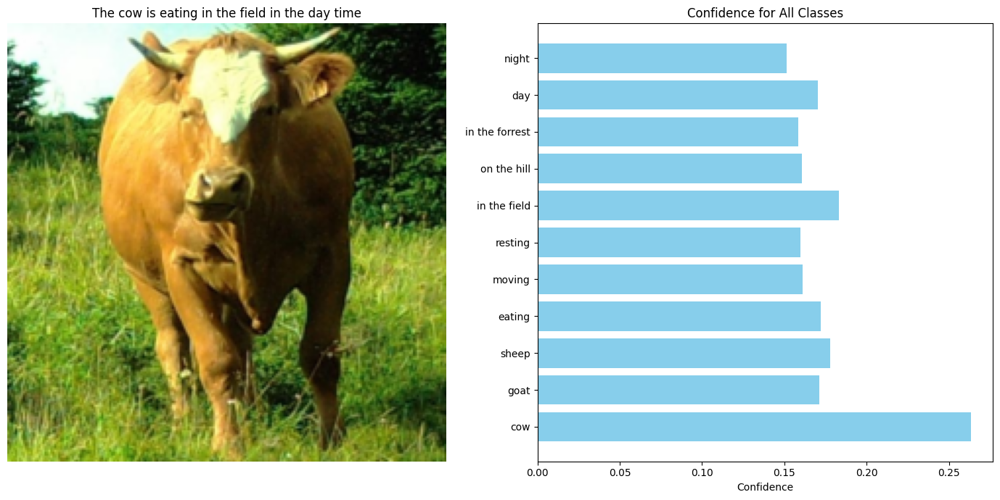

In [9]:
import os
import matplotlib.pyplot as plt

# List untuk hasil klasifikasi
results = []
confidence_per_image = []

# Jumlah gambar yang ingin ditampilkan
num_images_to_display = 5

# Iterasi gambar dalam folder (hanya beberapa gambar)
for idx, image_name in enumerate(os.listdir(data_folder_path)):
    if image_name.lower().endswith(('.jpg', '.png', '.jpeg')):
        image_path = os.path.join(data_folder_path, image_name)

        # Prediksi kategori dengan nilai confidence maksimal
        result = classify_image(image_path)
        confidence = result["Confidence"]

        # Simpan hasil prediksi dan confidence
        results.append({
            "Image": image_name,
            "Predicted Animal": result["Best Animal"],
            "Predicted Behavior": result["Best Behavior"],
            "Predicted Place": result["Best Place"],
            "Predicted Time": result["Best Time"],
            "Prediction Sentence": f"The {result['Best Animal']} is {result['Best Behavior']} {result['Best Place']} in the {result['Best Time']}"
        })

        confidence_per_image.append({
            "Image": image_name,
            "Confidence Animal": ", ".join([f"{animals[i]}: {confidence['Animal'][i]:.2f}" for i in range(len(animals))]),
            "Confidence Behavior": ", ".join([f"{behaviors[i]}: {confidence['Behavior'][i]:.2f}" for i in range(len(behaviors))]),
            "Confidence Place": ", ".join([f"{places[i]}: {confidence['Place'][i]:.2f}" for i in range(len(places))]),
            "Confidence Time": ", ".join([f"{times[i]}: {confidence['Time'][i]:.2f}" for i in range(len(times))]),
        })

        # Visualisasi hasil
        fig, ax = plt.subplots(1, 2, figsize=(14, 7))
        
        # Tampilkan gambar hasil augmentasi
        ax[0].imshow(result["Augmented Image"].permute(1, 2, 0).cpu().numpy())
        ax[0].axis("off")
        ax[0].set_title(f"The {result['Best Animal']} is {result['Best Behavior']} {result['Best Place']} in the {result['Best Time']} time")
        
        # Visualisasi confidence
        categories = animals + behaviors + places + times
        confidences = confidence["Animal"] + confidence["Behavior"] + confidence["Place"] + confidence["Time"]
        ax[1].barh(categories, confidences, color="skyblue")
        ax[1].set_title("Confidence for All Classes")
        ax[1].set_xlabel("Confidence")
        
        plt.tight_layout()
        plt.show()

        # Hentikan setelah menampilkan sejumlah gambar tertentu
        if idx + 1 >= 5:
            break


In [4]:
# Simpan hasil ke CSV
df_results = pd.DataFrame(results)
df_confidence = pd.DataFrame(confidence_per_image)

output_results_csv = os.path.join(data_folder_path, "Model RN50.csv")
output_confidence_csv = os.path.join(data_folder_path, "confidence_RN50.csv")

df_results.to_csv(output_results_csv, index=False)
df_confidence.to_csv(output_confidence_csv, index=False)

print(f"Hasil prediksi disimpan di: {output_results_csv}")
print(f"Confidence values per class disimpan di: {output_confidence_csv}")

Hasil prediksi disimpan di: C:\Users\USER\Documents\Semester 7\DL\Tubes\Data Tubes DL\Dataset\final_predictions_RN50.csv
Confidence values per class disimpan di: C:\Users\USER\Documents\Semester 7\DL\Tubes\Data Tubes DL\Dataset\confidence_values_per_class_RN50.csv


In [5]:
# Membaca file CSV hasil prediksi
df_results = pd.read_csv(output_results_csv)

# Membuat kombinasi teks
df_results['Combination'] = (
    df_results['Predicted Animal'] + ' ' +
    df_results['Predicted Behavior'] + ' ' +
    df_results['Predicted Place'] + ' ' +
    df_results['Predicted Time']
)

# Menghitung jumlah kombinasi unik
unique_combinations = df_results['Combination'].value_counts()

# Print hasil kombinasi unik
print("Jumlah kombinasi unik yang dihasilkan:")
print(unique_combinations)

# Menampilkan jumlah total kombinasi unik
print(f"\nTotal kombinasi unik: {len(unique_combinations)}")


Jumlah kombinasi unik yang dihasilkan:
Combination
cow eating in the field day           58
sheep eating in the field day         48
cow eating in the forrest day         39
sheep eating on the hill day          16
sheep resting in the field day        16
cow eating on the hill day            13
cow resting in the field day          11
sheep eating in the forrest night     10
sheep eating on the hill night        10
sheep moving on the hill day          10
sheep eating in the field night        6
cow eating in the forrest night        6
sheep resting in the field night       4
sheep resting in the forrest night     4
sheep resting on the hill day          4
sheep eating in the forrest day        4
cow resting in the forrest day         4
cow moving in the field day            3
sheep resting in the forrest day       2
sheep moving on the hill night         2
sheep resting on the hill night        2
cow eating in the field night          2
cow resting on the hill day            1
sheep 

In [7]:
# Membaca file Excel untuk ground truth
ground_truth_excel_path = r"C:\Users\USER\Documents\Semester 7\DL\Tubes\Data Tubes DL\Dataset\dataset_class_clip.xlsx"
ground_truth_df = pd.read_excel(ground_truth_excel_path)

# Memastikan kolom-kolom ground truth ada dalam file Excel
ground_truth_dict = dict(zip(ground_truth_df["Image"], ground_truth_df[["Animal", "Behavior", "Place", "Time"]].values))

Jumlah prediksi 100% benar: 27


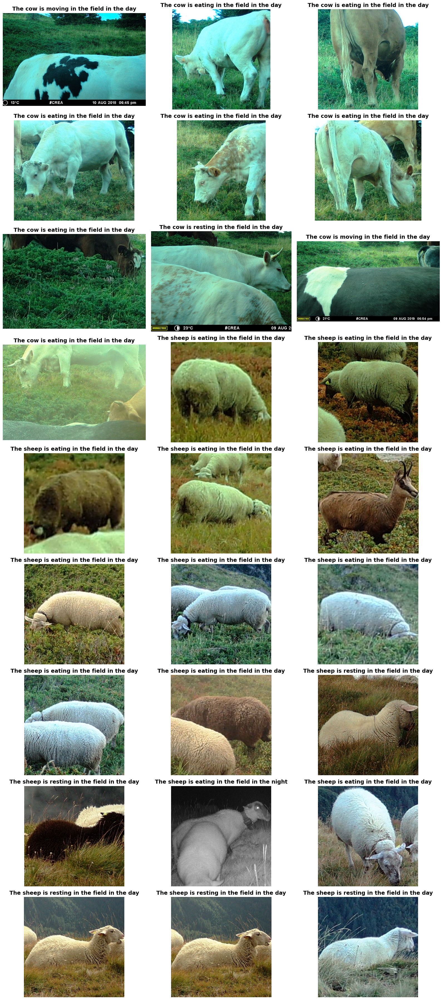

In [8]:
# Fungsi untuk mengecek prediksi benar
correct_predictions = []
for _, row in df_results.iterrows():
    image_name = row["Image"]
    if image_name in ground_truth_dict:
        gt_animal, gt_behavior, gt_place, gt_time = ground_truth_dict[image_name]
        if (
            row["Predicted Animal"] == gt_animal and
            row["Predicted Behavior"] == gt_behavior and
            row["Predicted Place"] == gt_place and
            row["Predicted Time"] == gt_time
        ):
            correct_predictions.append(image_name)

# Hitung jumlah prediksi yang 100% benar
num_correct_predictions = len(correct_predictions)
print(f"Jumlah prediksi 100% benar: {num_correct_predictions}")

# Menampilkan gambar dalam grid
image_paths = [os.path.join(data_folder_path, img) for img in correct_predictions]
predicted_sentences = df_results[df_results['Image'].isin(correct_predictions)]['Prediction Sentence'].tolist()

# Fungsi untuk menampilkan gambar dalam grid dengan ukuran teks lebih besar
def display_images_in_grid(image_paths, predicted_sentences, grid_cols=3):
    grid_rows = (len(image_paths) + grid_cols - 1) // grid_cols
    fig, axes = plt.subplots(grid_rows, grid_cols, figsize=(16, 4 * grid_rows))
    axes = axes.flatten()
    
    for i, (image_path, sentence) in enumerate(zip(image_paths, predicted_sentences)):
        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].axis("off")
        # Ukuran teks diperbesar menjadi 14
        axes[i].set_title(sentence, fontsize=14, fontweight="bold")  # Tambahkan fontweight jika ingin tebal
    
    # Remove unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis("off")
    
    plt.tight_layout()
    plt.show()

# Menampilkan hasil gambar dengan prediksi 100% benar
display_images_in_grid(image_paths, predicted_sentences)